# Constrain Cropping with Linear Programming
Our task is to find the maximum area, fixed-aspect rectangle within an arbitrary quadrilateral. We build on concepts from [Eberly (2008)](https://www.geometrictools.com/Documentation/MaximumAreaAspectRectangle.pdf). First, we define the quadrilateral $V = [\ V_i\ \vert\ i \leq 0 < 4 ]$, with $V_0$ being the lower left corner of the quadrilateral, and subsequent vertices going counter-clockwise.

We search for a rectangle $R$ such that:
- $R_0 = (u, v)$
- $R_1 = (u+w, v)$ 
- $R_2 = (u+w, v+h)$
- $R_3 = (u, v+h)$

Because the rectangle has a fixed aspect $r$, we have $h = w / r$. Our task is then to find:
$$
\underset{u, v, w}{\text{argmax}} f(w) = w
$$

We use linear programming instead of the geometric construction. We build constraints for the system, taking advangate of the fact that $\forall i, R_i \in V$. This is expressed by checking each $R_i$ against the internal-facing normals of $V$:

$$
\hat{N}_i \cdot (R_j - V_i) \geq 0
$$

Thus, we have the following construction:

1. We compute the set of normals $\{ \hat{N}_i \}$

2. For each normal $\hat{N}_i$, we compute its quadrant. Let $\langle x, y \rangle = \hat{N}_i$. Then:
    - When $x > 0$ and $y > 0$, then $\hat{N}_i$ is in the 1st quadrant, we constrain $R_0$.
    - When $x < 0$ and $y > 0$, then $\hat{N}_i$ is in the 2nd quadrant, we constrain $R_1$.
    - When $x < 0$ and $y < 0$, then $\hat{N}_i$ is in the 3rd quadrant, we constrain $R_2$.
    - When $x > 0$ and $y < 0$, then $\hat{N}_i$ is in the 4th quadrant, we constrain $R_3$.

3. We define $R_i$ in terms of $\vec{x} = \langle u, v, w \rangle$:
$$
R_0 = \begin{bmatrix} 1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix} \begin{bmatrix} u \\ v \\ w \end{bmatrix},\\
R_1 = \begin{bmatrix} 1 & 0 & 1 \\ 0 & 1 & 0 \end{bmatrix} \begin{bmatrix} u \\ v \\ w \end{bmatrix},\\
R_2 = \begin{bmatrix} 1 & 0 & 1 \\ 0 & 1 & \frac{1}{r} \end{bmatrix} \begin{bmatrix} u \\ v \\ w \end{bmatrix},\\
R_3 = \begin{bmatrix} 1 & 0 & 0 \\ 0 & 1 & \frac{1}{r} \end{bmatrix} \begin{bmatrix} u \\ v \\ w \end{bmatrix}
$$

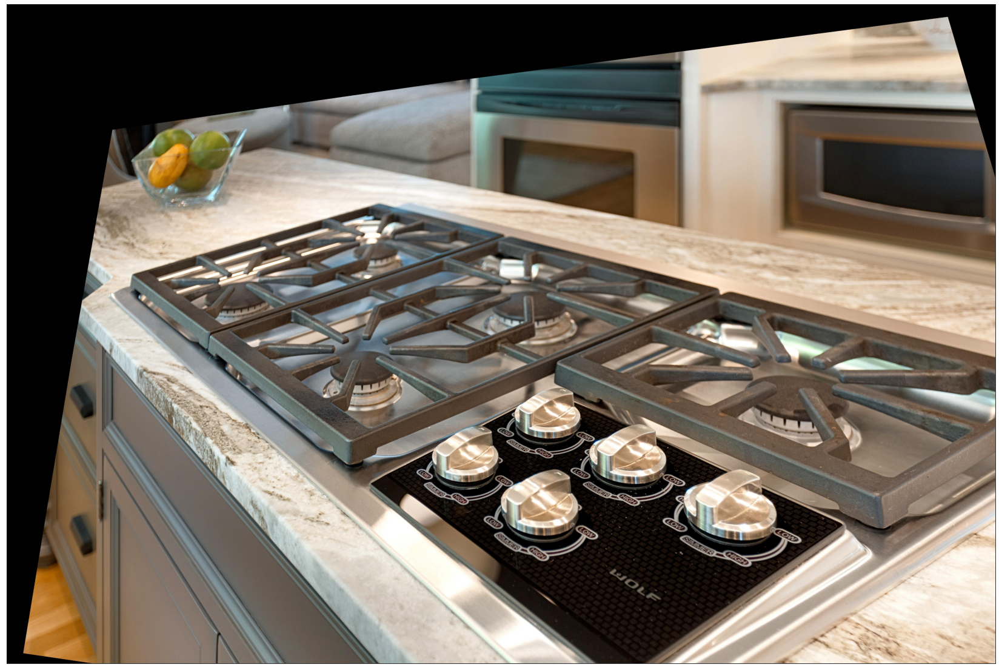

In [1]:
from matplotlib import pyplot as plt
from PIL import Image

# Load image
image = Image.open("../test/media/constrain/straight.jpg")

# Plot
plt.figure(figsize=(30,20))
plt.imshow(image)
plt.xticks([])
plt.yticks([])
plt.show()

The above image is computed from the following homography:

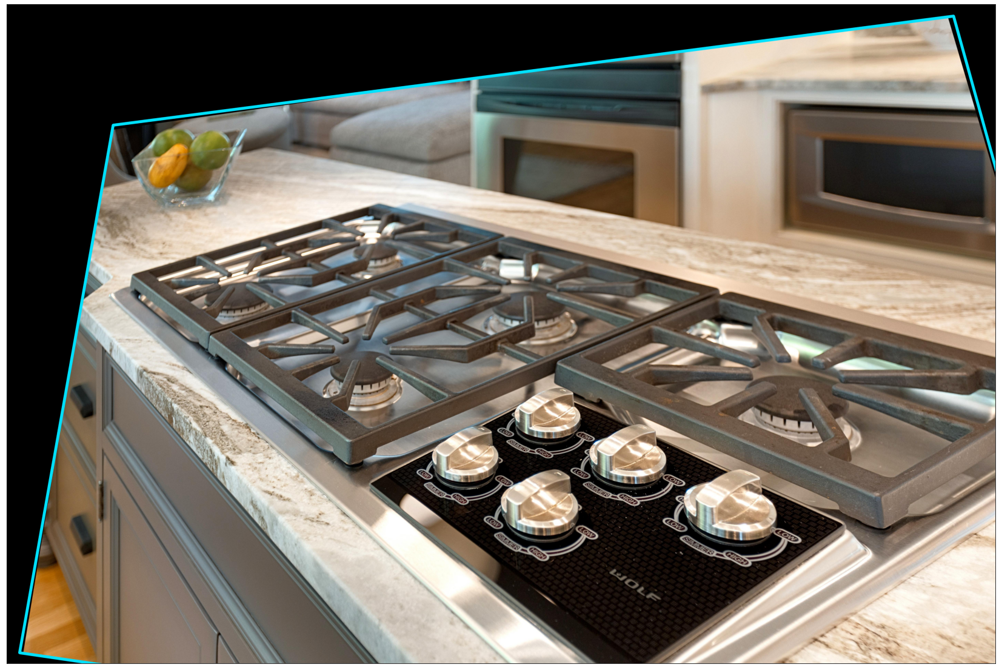

In [13]:
from cv2 import line, transform
from numpy import array, asarray, float32

# Transform source rect
H = array([
    [ 5.62695335e-01, -1.46033827e-01,  6.20316015e+02],
    [-1.14082325e-01,  5.87215920e-01,  7.07646201e+02],
    [-5.20947217e-05, -5.62274786e-05,  1.00000000e+00]
])
src_rect = array([
    [0, 0],
    [image.width, 0],
    [image.width, image.height],
    [0, image.height]
], dtype=float32)

# Compute destination rect
dst_rect = transform(src_rect[None,:], H)
dst_rect = dst_rect[0,:,:2] / dst_rect[0,:,2:]

# Draw
line_image = asarray(image)
for i in range(4):
    x1, y1 = dst_rect[i].astype(int)
    x2, y2 = dst_rect[(i+1) % 4].astype(int)
    line(line_image, (x1, y1), (x2, y2), (0, 225, 255), 16)

# Plot
plt.figure(figsize=(30,20))
plt.imshow(line_image)
plt.xticks([])
plt.yticks([])
plt.show()

Now, we compute $\{ \hat{N}_i \}$:

In [61]:
dst_rect

array([[ 620.31604,  707.6462 ],
       [5516.8613 ,   72.19531],
       [6819.2744 , 4763.103  ],
       [  75.94334, 3778.353  ]], dtype=float32)

In [62]:
edges

array([[ 4896.5454 ,  -635.45087],
       [ 1302.4131 ,  4690.9077 ],
       [-6743.331  ,  -984.75   ],
       [  544.3727 , -3070.7068 ]], dtype=float32)

In [65]:
from numpy import diff, zeros_like
from numpy.linalg import norm

# Compute edges
edges = diff(dst_rect, axis=0, append=dst_rect[:1,:])

# Compute internal normals
normals = zeros_like(edges)
normals[:,0] = -edges[:,1]
normals[:,1] = edges[:,0]
normals = normals / norm(normals, axis=1, keepdims=True)
normals

array([[ 0.12869614,  0.99168414],
       [-0.96355057,  0.26752624],
       [ 0.14450052, -0.98950475],
       [ 0.98464704,  0.1745575 ]], dtype=float32)

Next, we compute $R_i$ for each normal:

In [66]:
aspect = image.width / image.height
R = []

# Compute matrices per normal
for x, y in normals:
    if x > 0 and y > 0:
        mat = array([
            [1., 0., 0.],
            [0., 1., 0.]
        ])
    elif x < 0 and y > 0:
        mat = array([
            [1., 0., 1.],
            [0., 1., 0.]
        ])
    elif x < 0 and y < 0:
        mat = array([
            [1., 0., 1.],
            [0., 1., 1. / aspect]
        ])
    else:
        mat = array([
            [1., 0., 0.],
            [0., 1., 1. / aspect]
        ])
    R.append(mat)
R = array(R)
R

array([[[1.        , 0.        , 0.        ],
        [0.        , 1.        , 0.        ]],

       [[1.        , 0.        , 1.        ],
        [0.        , 1.        , 0.        ]],

       [[1.        , 0.        , 0.        ],
        [0.        , 1.        , 0.66666667]],

       [[1.        , 0.        , 0.        ],
        [0.        , 1.        , 0.        ]]])

We reduce the matrices with the normals:

In [79]:
# Reduce
A_ub = []
for mat, normal in zip(R, normals):
    A_ub.append(normal @ mat)
A_ub = array(A_ub)
A_ub

array([[ 0.12869614,  0.99168414,  0.        ],
       [-0.96355057,  0.26752624, -0.96355057],
       [ 0.14450052, -0.98950475, -0.65966984],
       [ 0.98464704,  0.17455751,  0.        ]])

In [80]:
# Compute constraint right hand
b_ub = (normals * dst_rect).sum(axis=1)
b_ub

array([  781.59375, -5296.461  , -3727.7246 ,   734.31726], dtype=float32)

Now we optimize:

In [84]:
from cv2 import rectangle
from numpy import zeros
from scipy.optimize import linprog

# Optimize
c = array([ 0., 0., 1. ])
result = linprog(c, A_ub, b_ub)
result

     con: array([], dtype=float64)
     fun: 4993.6463451376485
 message: 'Optimization terminated successfully.'
     nit: 7
   slack: array([ 1.68951013e+02, -4.04934544e-05, -2.97010424e-05,  1.69495402e-05])
  status: 0
 success: True
       x: array([ 651.22987619,  533.26653372, 4993.64634514])

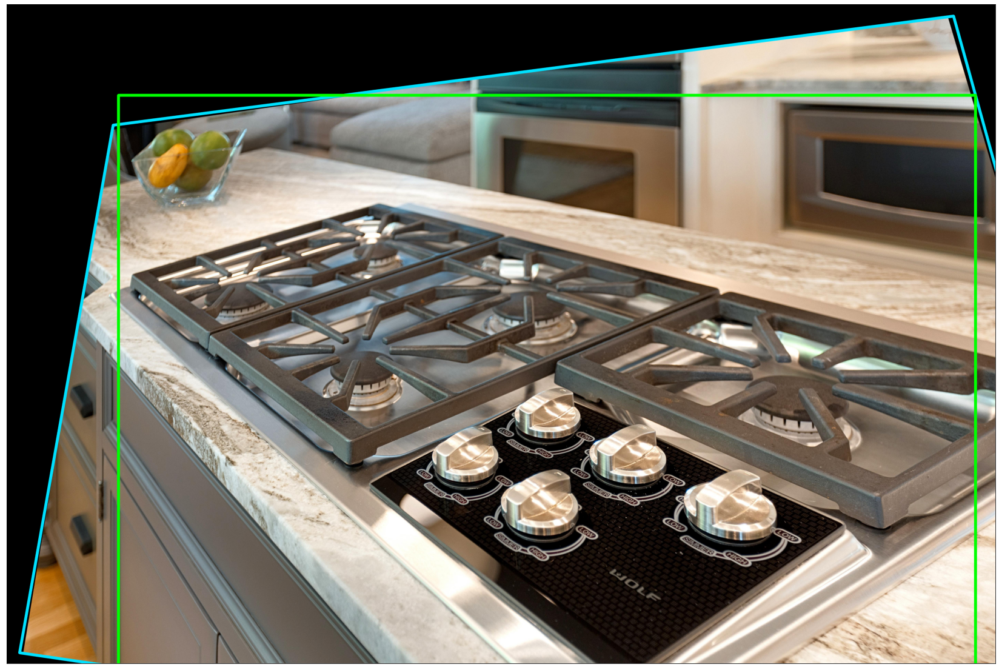

In [85]:
# Draw
u, v, w = result.x.astype(int)
result_image = line_image.copy()
rectangle(result_image, (u, v), (u + w, v + int(w / aspect)), (0,255,0), 16)

# Plot
plt.figure(figsize=(30,20))
plt.imshow(result_image)
plt.xticks([])
plt.yticks([])
plt.show()